<h1><b>Implementation and Evaluation of Otsu Thresholding</b></h1>
<p style = 'text-align : justify;'>
<I>
Topic 01 : Biomedical Image Analysis<br>  
Group 01.04 : Marie-Claire Indilewitsch, Helen Jade, Amelie Maribel Schneider, Ieva Sorokina-Ozola<br>   
Supervisor : PD Dr. Karl Rohr, Christian Ritter<br>  
Tutor : Marie Becker<br>  
18.07.2022  
</I>
</p>


***  


<h2><b>Abstract</b></h2>
<p style = 'text-align : justify;'>
Otsu thresholding is a common image segmentation method. In our project we focused on cell nuclei segmentation using Otsu thresholding as well as its variations to achieve optimal image segmentation. Different preprocessing methods and Otsu thresholding variations were applied to three different datasets (N2DH-GOWT1, N2DL-HeLa, NIH3T3) in order to achieve optimal cell nuclei segmentation for each dataset. Median filter, gaussian filter and histogram stretching as well as their combinations served as preprocessing methods, whereas global Otsu thresholding, two-level Otsu and local adaptive thresholding were used as thresholding algorithms. Furthermore, a hole filling algorithm was introduced as a postprocessing method for one dataset. Lastly, the processed images were compared to the corresponding ground truth images, using Dice score as the evaluation method. Each dataset had different challenges (reflections, noise, varying brightness) which were individually considered in the image analysis. To find the best segmentation outcome, the different combinations of preprocessing methods and Otsu thresholding variations were applied and the optimal one for each dataset was selected. Finally, we obtained the ideal segmented images for each dataset using the best individualized combination. 
</p>


***


<h2><b>Table of contents</b></h2>
1. Introduction  
2. Description of datasets   
2.1 N2DH-GOWT1  
2.2 N2DL-HeLa   
2.3 NIH3T3  
3. Methods     
3.1 Import of packages    
3.2 Preprocessing    
3.3 Thresholding    
3.4 Postprocessing   
3.5 Evaluation  
4. Results  
4.1 Global Otsu Thresholding  
4.2 Two-level Otsu Thresholding    
4.3 Local adaptive Otsu Thresholding    
4.4 Local adaptive two-level Otsu Thresholding  
4.5 Local adaptive two-level Otsu Thresholding clip    
5. Discussion  
5.1 Global Otsu Thresholding  
5.2 Two-level Otsu Thresholding  
5.3 Local adaptive Otsu Thresholding  
6. Conclusion  
7. References  


*** 


<h2><b>1. Introduction</b></h2>
<p style = 'text-align : justify;'>

Image segmentation represents an important building block in image processing and computer vision, and is used in a wide variety of areas, such as in biomedical image analysis (Minaee <I>et al.</I>, 2022). For instance, segmentation methods are applied to determine cell boundaries precisely, to examine cells in terms of their phenotype, to count the number of cell nuclei for better localization of the cells or to locate tumors (Liu <I>et al.</I>,2018). By using time-lapse images, insights into cell migration and proliferation can be achieved using image segmentation (Ulman <I>et. al</I>, 2017). In general, image segmentation methods examine the properties of pixels and reasonably assign the pixels to an object or group, resulting in a binary image.<br>
<br>
There are many different methods for automatic image segmentation such as pixel oriented, edge oriented, region oriented and cluster-based procedures. Prominent examples are Otsu thresholding (Otsu, 1979), Region growing (Nock and Nielsen, 2004) or k-means clustering (Dhanachandra et. al, 2015).<br>
<br>
Thresholding is the most widely used binarization method. By automatically selecting a threshold intensity value, the image can be separated into two classes: pixels with a lower and equal intensity and pixels with a higher intensity than the threshold value. Otsu thresholding represents the most applied thresholding method and is used as the fundamental thresholding algorithm in our project as well (Otsu, 1979).<br>
<br>
In our project three different datasets have been used as a benchmark to evaluate our implemented thresholding algorithms (Ljosa <I>et al.</I>, 2012). Each dataset holds specific features such as low contrast, non-uniform illumination noise or reflections, which challenge the algorithm to correctly distinguish the objects, in our case the cell nuclei, from the background. To improve the efficiency of the thresholding algorithm, different preprocessing and/ or postprocessing methods were applied to each dataset.<br>
<br>
To evaluate the performance and accuracy of the proposed segmentation method, the Dice similarity coefficient was used. This metric measures the similarity of two images, by comparing the segmented image to a reference image, which provides information about the accuracy of the obtained segmented images (Dice, 1945).
</p>


***


<h2><b>2. Description of datasets</b></h2>
<p style = 'text-align : justify;'>
The three different datasets (N2DH-GOWT1, N2DL-HeLa and NIH3T3) are publicly available standard datasets, which are provided to evaluate proposed algorithms such as cell nuclei segmentation algorithms. Each dataset embodies specific features, that could challenge and affect the efficiency of the developed nuclei segmentation algorithm. In addition, for each dataset the corresponding ground truth images are provided, which show the 'true' segmentation and are used as reference images to quantify the accuracy of the final segmentation output.
</p>
<br>
<h4><b>2.1 N2DH-GOWT1</b></h4>
<p style = 'text-align : justify;'>
The datset N2DH-GOWT1 contains 6 images, showing GFP transfected mouse (<I>Mus musculus</I>) embryonic stem cells. These images were captured using a confocal microscope system (Leica TGS SP5). Moreover, the images have a size of 1024x1024 pixels and an approximate cell nuclei count of 10 to 20 per image. To visualize the cell nuclei, the transcription factor Oct4 was tagged with GFP. However, unstained regions (holes) can be identified within the cell nuclei, which can be attributed to the fact that Oct4 is only located in the nuclei and not in the nucleolus (Bártová <I>et al.</I>, 2011). This might not influence the thresholding algorithm itself, but further evaluation and comparison to the ground truth images. The main challenge of this dataset is varying brightness within the cell nuclei as well as partly low contrast to the background and noise. Without further image preprocessing the segmentation algorithm might fail to distinguish all cell nuclei correctly from the background.
</p>
<br>
<h4><b>2.2 N2DL-HeLa </b></h4>
<p style = 'text-align : justify;'>
The N2DL-Hela dataset contains 4 images, showing human (<I>Homo sapiens</I>) epithelial cells of cervical cancer. These images were captured using an Olympus IX81 microscope. Furthermore, the images have a size of 1100x700 pixels and contain an average of 30-50 cell nuclei per image. The cells are modified to stably express H2b-GFP in order to visualize the cell nuclei (Neumann <I>et al.</I>, 2010). For this dataset the segmentation algorithm is challenged by varying brigthness of the cell nuclei.
</p>
<br>
<h4><b>2.3 NIH3T3</b></h4>
<p style = 'text-align : justify;'>
The NIH3T3 dataset contains 18 images, showing mouse (<I>Mus musculus</I>) embryonic fibroblast cells. These images were captured using fluorescence microscopy, have a size of 1344x1024 pixels and contain about 60 cell nuclei per image. To visualize the cell nuclei, Hoechst was used as a staining method (Coelho <I>et al.</I>, 2009). This dataset embodies challenging features like bright spots and reflections as well as a non-uniformal background, which might massively disturb the segmentation.
</p>


***


<h2><b>3. Methods</b></h2>
<h3><b>3.1 Packages</b></h3>

In [2]:
# Import of modules

path = (os.path.abspath(os.path.join(r'.', os.pardir)))
import sys
sys.path.append(path)
from nuclei_segmentation import complete_analysis as ca
from nuclei_segmentation import preprocessing as pp
from matplotlib import pylab, mlab
from IPython.core.pylabtools import figsize, getfigs
from pylab import *

***


<h3><b>3.2 Preprocessing</b></h3>
<p style = 'text-align : justify;'>
For each dataset different preprocessing methods were used in order to achieve the best possible Dice score as well as an optimal cell nuclei segmentaion. Therefore to best adress the aforementioned individual challenges, we chose the Gaussian filter, the median filter, histogram stretching and the combinations between histogram stretching and the filters as our preprocessing methods. Furthermore, it was necessary to find the optimal filtersize for each used filter and dataset, which was done by comparing the dice scores for different filter sizes. Lastly, we applied those five preprocessing methods on all our datasets in combination with different Otsu thresholding varations and compared them to find out which combination leads to the highest Dice score. 
</p>
<br>
<h4><b>Gaussian filter</b></h4>
<p style = 'text-align : justify;'>
The Gaussian filter is a 2D convolution operator, which is used to blur images and reduce additive noise, such as Gaussian noise. The Gaussian kernel has the shape of the 2D zero-mean Gaussian function (bell-shaped), so the central pixel is weighted more highly than pixels further out. That means the further away from the central pixel, the less information is used to filter the central pixel. In addition, the standard deviation σ and filtersize N are required as input for the calculation of the filter mask. The higher the selected σ, the stronger is the blurring effect and the wider is the resulting border. Because of these features, optimally, the filter helps to reduce noise, reflections and holes in the images of the different datasets (Rohr and Ritter, 2022). 
</p>

$$ G_σ(x,y) = \frac{1}{σ^2 2π}e^\frac{-(x^2+y^2)}{2σ^2}$$

<br>
<h4><b>Median filter</b></h4>
<p style = 'text-align : justify;'>
The median filter is a non-linear filter and applied to reduce impulsive noise (Salt-and-pepper noise) in images. For each pixel the intensity values of a predefined NxN neighborhood are ranked by size. The median value of the ranked list is then used to replace the intensity value of the central pixel. Compared to the Gaussian filter, the Median filter is not sensitive to edges, resulting in less blurring effect while the overall noise reduced. However, smoothing and displacement of some structures can still occur (Rohr and Ritter, 2022).
</p>
<br>
<h4><b>Histogram stretching</b></h4>
<p style = 'text-align : justify;'>
Histogram stretching is a preprocessing method that can be used to enhance the contrast of an image. Herefore, the image intensity values are stretched out to cover the whole desired range of the pixel intensity values (e.g. 0-255), thus it is a linear scaling operation. This method is especially useful for images with a restricted range of pixel intensities and therefore a narrow intensity value histogram. It is not used if the image contains pixels which intensity value corresponds to the minimum and maximum of the desired range (Nixon and Aguado, 2002). Thus, we clipped the upper and lower 2%-quantile of our intensity value histograms and then stretched out the images to achieve a higher contrast within our desired range. 
</p>

$$P_{out} = (P_{in} - c)\frac{(b-a)}{(d-c)}+a$$

<p style = 'text-align : justify;'>
This is the used formula for the histogram stretching, where P<sub>in</sub> represents the intensity value before the stretching and P<sub>out</sub> after, a and b the lower and upper pixel values of the desired range and c and d the current minimum and maximum intensity values present in the image (E. Davies, 2012 )
</p>


***


<h3><b>3.3 Thresholding</b></h3>
<h4><b>Global Otsu Thresholding</b></h4>
<p style = 'text-align : justify;'>
Automatic threshold selection respresents a fundamental building block for image processing and segmentation. By selecting a threshold of gray level, the image can be separated into two classes: pixels with a lower and equal intensity and pixels with a higher intensity than the threshold value. In this case, global thresholding algorithms use a single threshold globally for the whole image to separate foreground and background. Ideally, the histogram of an image shows a bimodal distribution, so that the threshold value can be chosen at the bottom of the valley between two peaks, respresenting foreground and background. Since this is rarely the case in reality, optimal thresholding can be achieved by performing Otsu's method.
Otsu thresholding is a non-parametric and unsupervised method of automatic threshold selection for picture segmentation, which uses the entire image to calculate the optimal threshold intensity in an automatic fashion. The algorithm iterates over all possible threshold intensity values and computes the between-class variance for each. The between-class variance <I>σ<sup>2</sup><sub>B</sub></I> is calculated from the probabilities of class occurance <I>ω<sub>i</sub></I>, the class mean levels <I>μ<sub>i</sub></I> and the total mean level <I>μ<sub>T</sub></I>. Finally, the intensity value, that maximizes the between-class variance and thus separates the image in two compact classes, is selected as optimal threshold intensity value (Otsu, 1979). 
</p>

$$σ^2_B = ω_0*ω_1(μ_1 - μ_0)^2$$

<p style = 'text-align : justify;'>
By assigning each pixel to the foreground or background depending on the calculated optimal threshold value, a segmented and binary image can be received, using image clipping. Pixel with lower or equal intensity values than the selected threshold value <I>T</I> are set to 0 (background) and equivalently pixels with higher intensity values than the optimal threshold value <I>T</I> are set to 1 (foreground).
</p>

$$I_{seg}(x,y)=\left\{\begin{array}{ccc} 0&if&I(x,y)  \leq T \\ 1&if&I(x,y) > T \end{array}\right.$$

<br>
<h4><b>Two-level Otsu Thresholding</b></h4>
<p style = 'text-align : justify;'>
Otsu thresholding is not selective for bright spots, reflections or artifacts, which arise from the image acquisition process and data transmission during microscopy. As a reason for that, pixels are assigned incorrectly to the foreground and thus identified falsely as cell nuclei. To solve this problem, Otsu's method can be extended to multithreshold problems, respectively two-level Otsu thresholding can be performed. The fundamental principle is to set two threshold values, which divide the image into three pixel classes (Otsu, 1979). The optimal set of threshold values is determined by maximizing the between-class variance between the three pixel classes as followed:
</p>
  
$$σ^2_B = ω_0*ω_1(μ_1 - μ_0)^2 + ω_0*ω_2(μ_2 - μ_0)^2 + ω_1*ω_2(μ_2 - μ_1)^2$$
  
<p style = 'text-align : justify;'>
The higher threshold intensity value is used to remove the bright spots and reflections from the original image, whereas the lower threshold value separates the cell nuclei from the background. In order to receive a binary image, all pixels with a lower or equal intensity level than the lower threshold value as well as all pixels with a higher intensity value than the upper threshold value are set to 0 (background). The remaining pixels, in range between the lower and upper threshold value, are converted to 1 (foreground). From here on this algorithm explained will be further refered to as two-level Otsu thresholding clip.
Furthermore, two-level Otsu thresholding can be used to segment images in which the objects, such as cell nuclei, can be divided into two groups in terms of their intensity values. These features are represented in the images of the N2DH-GOWT1 dataset, in which the cell nuclei seem to be distributed at two different levels. Ideally, the two thresholds would separate the cell nuclei from eachother, but also from the background. In this case, all pixels with a higher intensity level than the lower threshold and all pixels with a higher intensity level than the upper threshold are set to 1. The pixels with a lower or equal intensity value than the lower threshold are set to 0.
</p>
<br>
<h4><b>Local Adaptive Otsu Thresholding</b></h4>
<p style = 'text-align : justify;'>
Although, global Otsu thresholding is very fast and provides reliable results in most cases, it is susceptible to non-uniformal illumination, considerable background noise and varation in contrast. As a reason for that, pixels can not be clearly assigned to foreground or background, which results in improperly segmented images. In order to overcome this problem, the implemented global segmentation method can be extended to local thresholding, being a more appropriate and accurate binarization method. Local Otsu thresholding uses non-overlapping windows to divide the original image into a distinct number of regions and to determine the optimal threshold of each. Due to contrast and illumination variation even in small regions especially in the NIH3T3 dataset, local adaptive Otsu thresholding, using overlapping windows, is performed. The key idea is to use a sliding window, a rectangular frame of a fixed size, which iterates over the image and calculates a unique threshold value for each iteration by Otsu thresholding. This implicates, that during the stepwise iteration multiple threshold values are calculated for each pixel, depending on the grayscale information of its local neighbourhood. To assign each pixel to foreground or background, two possible options were elaborated. On one hand, the optimal threshold intensity value can be determined by calculating the mean of the  threshold values, which were assigned to the pixel. By performing image clipping afterwards, a binary and segmented image can be received. This algorithm is further refered to as local adaptive Otsu thresholding average. On the other hand, each pixel can be assigned to the foreground or background, by counting to what the pixel has been assigned to more often. This algorithm is further refered to as local adaptive Otsu thresholding count. 
</p>
<br>
<p style = 'text-align : justify;'>
An additional variable: sensitivity, a number in range [0:1], was introduced to the local adaptive Otsu thresholding counts algorithm. This variable sets a lower proportion threshold A<sub>min</sub>, where proportion A for a unique pixel is described by the formula:
</p>

$$A = \frac{F}{F+B}$$

<p style = 'text-align : justify;'>
Here, F and B correspond to the number of times a certain pixel has been assigned to foreground or background after all iterations. Pixels with A<sub>min</sub> would be assigned to foreground, while the rest would be set to background in the final image segmentation. Setting a higher sensitivity value would reduce the number of falsely assigned foreground pixels, while a lower one would decrease false assignment of background pixels, thus increasing the confidence with which the certain pixel type is assigned. Depending on the nature of input image (predicted proportion of background and foreground), change in sensitivity can both positively and negatively influence the dice score and by changing this variable, the local thresholding algorithm can be fine tuned for specific datasets or single images. In this project, sensitivity value of 0.5 was used, as it results in picture segmentation according to the mode of foreground/background assigment of the pixel.
</p>
<br>
<p style = 'text-align : justify;'>
To achieve efficiency and accuracy it is important to select the right stepsize and framesize. Since the calculation of the threshold value from the local neighbourhood is to be applied to each frame as a separate image, local adaptive thresholding algorithms are slower than global thresholding algorithms. To remove reflections and bright spots especially in the NIH3T3 dataset, local adaptive thresholding, using two-level Otsu thresholding instead of global Otsu thresholding, can be applied. Additionaly local adaptive Otsu thresholding using two level Otsu thresholding clip was performed. 
</p>


***


<h3><b>3.4 Postprocessing</b></h3>
<h4><b>Hole filling</b></h4>
<p style = 'text-align : justify;'>
As described above, the cell nuclei in the images of N2DH-GOWT1 show unstained regions (holes), identified as nucleolei. These holes have similar intensity values to the background, which makes it impossible for the thresholding algorithm to identify these regions as part of the cell nuclei. As a reason for that these pixels are falsely assigned to the background, which influcences further evaluation and comparison to the ground truth images. As a solution for that a hole filling algorithm, provided by OpenCV, can be performed as postprocessing method. Starting from the thresholded binary image, the algorithm performs flood filling, which captures areas of contiguous pixels of a similar intensity value (background) and sets them to 1. After that the flood filled image is inverted and the pixels belonging to background as well as to cell nuclei are set to 0, whereas the pixels belonging to the nucleoluses (holes) are converted to 1. Lastly, the thresholded binary image is combined with the inverted flood filled image to obtain the final output image with the holes filled in. Furthermore the hole filling algorithm requires a suitable kernel size as input for proper identification of the holes.
</p>


***


<h3><b>3.5 Evaluation</b></h3>
<h4><b>Dice Score</b></h4>
<p style = 'text-align : justify;'>
The Dice similarity coefficient or Sørensen-Dice coefficient (DSC) is commonly used to evaluate the performance and accuracy of segmentation algorithms. It measures the similarity between two images: the segmented image and its corresponding ground truth image (Dice, 1945). By overlaying these two images the Dice similarity coefficient identifies the pixels which were assigned correctly (TP), the pixels which were falsely set to the foreground (FP) and the ones which were assigned incorrectly to the background (FN). The Dice score can be calculated, using the following equation:
</p>

$$DSC = \frac{2TP}{2TP+FP+FN}$$

<p style = 'text-align : justify;'>
In the case of optimal image segmentation, the processed image and the ground truth image would be identical. This would result in all pixels being correctly assigned (FP = 0 , FN = 0) and the received Dice score would be 1. In the event of no similarity between two images, no pixels would have been assigned correctly (TP = 0) and the obtained Dice score would be 0. According to that the Dice score is limited to the interval [0 ; 1]. The closer the Dice score is to 1, the more similar are the processed image and the ground truth image and therefore the more precise is the segmentation algorithm.
</p>

***


<h2><b>4. Results</b></h2>
<p style = 'text-align : justify;'>
The precision and efficiency of different Otsu thresholding algorithms were examined, by applying them to three different standard datasets (N2DH-GOWT1, N2DL-HeLa and NIH3T3) with specific disruptive factors and challenges for each. In general, global Otsu thesholding and two-level Otsu thresholding were applied to all three datasets. However, two-level Otsu thresholding clip was only performed on the NIH3T3 dataset, local adaptive Otsu thresholding (combined with standard Otsu thresholding) was only used for N2DL-HeLa and NIH3T3 and local adaptive Otsu thresholding (combined with two-level Otsu thresholding and two-level Otsu thresholding clip) was only applied to selected image examples for each dataset. 
In addition, for each Otsu thresholding method (except local adaptive Otsu thresholding combined with two-level Otsu thresholding and two-level Otsu thresholding clip) five different preprocessing methods were applied prior to thresholding and compared to each other: median filter, Gaussian filter, histogram stretching and the two combinations between histogram stretching with median filter and Gaussian filter. For the first dataset (N2DH-GOWT1) postprocessing in form of hole filling was used. Furthermore, the efficiency of each Otsu thresholding algorithm and preprocessing method was evaluated with the Dice similarity coefficient and visualized in boxplots. The optimal preprocessing method for each Otsu thresholding algorithm was identified by comparing the Dice score medians of each preprocessing method and by selecting the one, that maximizes the Dice score median.<br>
</p>
<p style = 'text-align : justify;'>
All obtained boxplots were pre-calculated and saved as .png-files. The code is provided below and can be re-executed, if needed.
</p>
<br>

In [ ]:
# Run this code cell if the recalculation of global Otsu thresholding is desired.

ca.complete_analysis_global_otsu_all('all')

In [ ]:
# Run this code cell if the recalculation of two-level Otsu thresholding and two-level Otsu thresholding clip (only NIH3T3) is desired.

ca.complete_analysis_two_level_otsu_all('all')
ca.complete_analysis_two_level_clip()

In [ ]:
# Run this code cell if the recalculation of local adaptive Otsu thresholding is desired.

ca.complete_analysis_local_otsu_all('all')

***


<h3><b>4.1 Global Otsu thresholding</b></h3>
<h4><b>N2DH-GOWT1</b></h4>
<p style = 'text-align : justify;'>
By applying global Otsu thresholding and different preprocessing methods to every single image in the dataset, the boxplot 'Preprocessing methods - N2DH-GOWT1 - Global Otsu Thresholding' in Figure 1 can be obtained. It shows the distribution of the resulting Dice score values for each preprocessing method, enabling to identify the best preprocessing method for global Otsu thresholding in this dataset. By comparing the median Dice scores of each preprocessing method, histogram stretching was identified as most efficient preprocessing method for the N2DH-GOWT1 dataset (median Dice score = 0.8864). The segmented images without preprocessing showed high Dice score values as well, but also a higher spread. In general, it is noticeable that, according to the Dice score values, preprocessing methods using histogram stretching result in a more precise segmentation than other preprocessing methods. Especially, the application of median filter and Gaussian filter seems to be inefficient and leads to less well segmented images. This phenomenon can be traced back to the side effects of median and Gaussian filter usage and will be further explained in the discussion.
</p>
<br>
<h4><b>N2DL-HeLa</b></h4>
<p style = 'text-align : justify;'>
The boxplot 'Preprocessing methods - N2DL-HeLa - Global Otsu Thresholding' in Figure 1 shows the Dice score distribution for each preprocessing method applied on the N2DL-HeLa dataset prior to global Otsu thresholding. It can be identified that, preprocessing methods including histogram stretching show a higher median dice score and less spread than preprocessing methods without histogram stretching. However, these both groups of preprocessing methods seem to be distributed among themselves in the same range of obtained Dice score values. The combination of histogram stretching and median filter shows the highest median Dice score of 0.8085 and is selected as the best preprocessing method for the N2DL-Hela dataset. In comparison to the N2DH-GOWT1 dataset, applying no preprocessing and histogram stretching to the N2DL-HeLa dataset results in a lower median Dice score. 
</p>
<br>
<h4><b>NIH3T3</b></h4>
<p style = 'text-align : justify;'>
The boxplot 'Preprocessing methods – NIH3T3- Global Otsu Thresholding' in Figure 1 shows the Dice score distribution for each preprocessing method applied on the NIH3T3 dataset prior to global Otsu thresholding. Preprocessing methods including histogram stretching show a slightly higher median dice score and less spread than preprocessing methods without histogram stretching. But obviously, compared to the other boxplots in Figure 1, huge spread of the Dice score values can be identified. Dice score values close to 1 and even dice score values of 0.000 were obtained for specific images of the NIH3T3 dataset. Possible reasons for this huge spread of data as well as the performance and precision of global Otsu thresholding on this dataset are elucidated in the discussion. As the combination of histogram stretching and median filter shows the highest median Dice score of 0.7003, it is selected as the best preprocessing method for the NIH3T3 dataset.
</p>
<br>

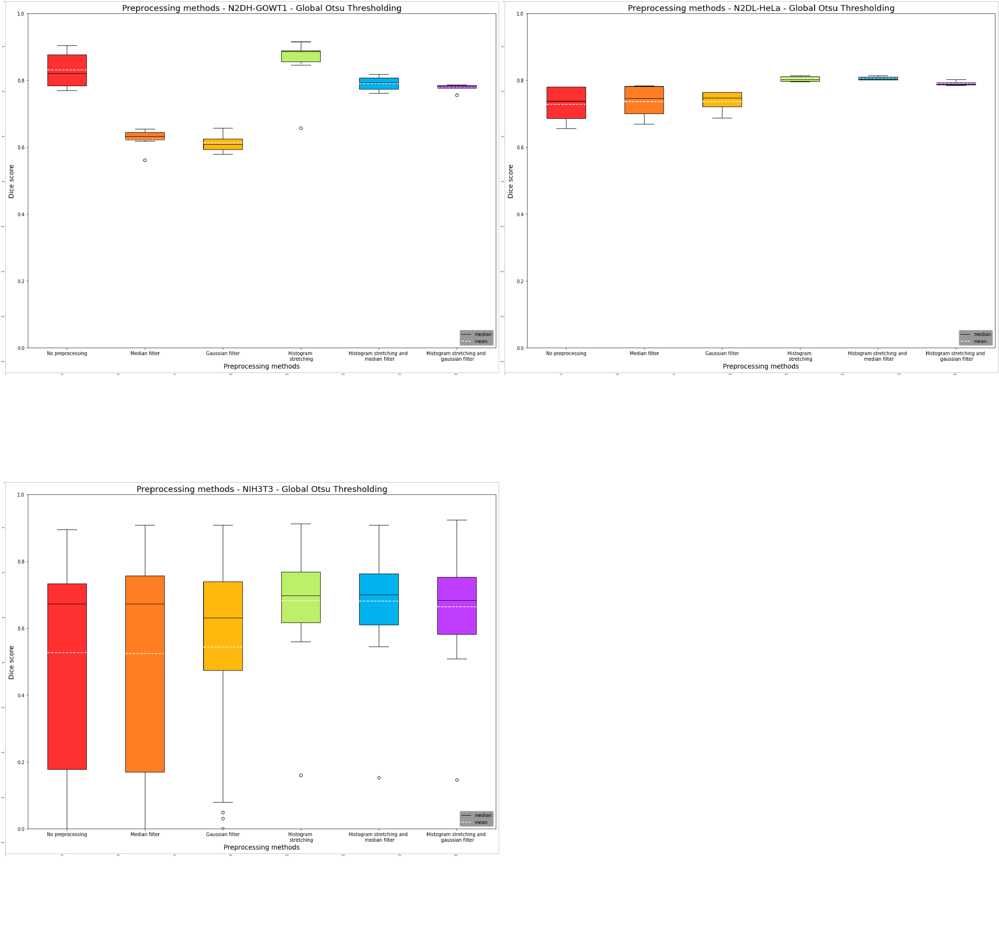

In [5]:
# Figure 1: Visualization of all obtained results for global Otsu thresholding, applied on each dataset.

Preprocessing_methods_N2DH_GOWT1_Global_Otsu_Thresholding = imread(r'Outputs_Boxplots/Preprocessing_methods_N2DH-GOWT1_Global_Otsu_Thresholding.png')
Preprocessing_methods_N2DL_HeLa_Global_Otsu_Thresholding = imread(r'Outputs_Boxplots/Preprocessing_methods_N2DL-HeLa_Global_Otsu_Thresholding.png')
Preprocessing_methods_NIH3T3_Global_Otsu_Thresholding = imread(r'Outputs_Boxplots/Preprocessing_methods_NIH3T3_Global_Otsu_Thresholding.png')

pp.subplot_three(Preprocessing_methods_N2DH_GOWT1_Global_Otsu_Thresholding , Preprocessing_methods_N2DL_HeLa_Global_Otsu_Thresholding , Preprocessing_methods_NIH3T3_Global_Otsu_Thresholding)

***


<h3><b>4.2 Two-level Otsu thresholding</b></h3>
<p style = 'text-align : justify;'>
As described above, two-level Otsu thresholding is based on setting two thresholds and dividing the image into three pixel classes. Two-level Otsu thresholding can be used to reduce low contrast and to separate the cell nuclei from each other as well as from the background. Two-level Otsu thresholding clip can be used to remove reflections and bright spots. The performance and accuracy of both thresholding algorithms is stated below and elucidated in the discussion.
</p>
<br>
<h4><b>N2DH-GOWT1</b></h4>
<p style = 'text-align : justify;'>
Using two-level Otsu thresholding the following boxplot 'Preprocessing methods-N2DH-GOWT1-Two-level Otsu thresholding' in Figure 2 was obtained to compare the different preprocessing methods by visualizing the distribution of the Dice scores. The optimal preprocessing method for this dataset with two-level Otsu thresholding is the median filter with a median Dice score of 0.85367. It is noticeable, that all preprocessing methods are quite high and distributed around the same range, except for histogram stretching. Also, the median filter seems to have a higher effect on the images than the Gaussian filter. Furthermore, the images in this dataset are different in terms of their challenges which can be seen by the wide range of the boxplot. Lastly, in this dataset the effect of the hole filling needs to be considered. The last two points will be further touched on in the discussion. 
</p>
<br>
<h4><b>N2DL-HeLa</b></h4>
<p style = 'text-align : justify;'>
Furthermore, the preprocessing methods for the N2DL-HeLa dataset were plotted in the boxplot 'Preprocessing methods-N2DL-HeLa-Two-level Otsu thresholding' in Figure 2. By using histogram stretching the highest median Dice score of 0.88659 was achieved. In this case the histogram stretching, median filter and their combination are the highest. In addition, as in the previous dataset, the median filter results in higher Dice scores than the Gaussian filter. Moreover, the histograms are narrower than in the first dataset which will be discussed further. 
</p>
<br>
<h4><b>NIH3T3</b></h4>
<p style = 'text-align : justify;'>
For this dataset the highest median dice score of 0.639966 could be achieved without any preprocessing. But by looking at the boxplot 'Preprocessing methods-NIH3T3-Two-level Otsu thresholding' in Figure 2 it can be seen that the Dice scores for this dataset are generally lower than for the other datasets and wider spread. Also, all preprocessing methods seem to have a negative effect on the Dice scores and there is no big difference between median and Gaussian filter. Because of the previously mentioned challenge of the reflections which can be found in this dataset we also used two-level Otsu thresholding clip on this dataset which removes the reflections thereby achieving a higher Dice score.<br> 
<br>
Here, using no preprocessing also achieves the highest median Dice score of 0.64939 which is slightly higher than the regular two-level Otsu thresholding Dice score. In addition, the boxplot 'Preprocessing methods-NIH3T3-Two-level Otsu thresholding clip' in Figure 2 is very similar to the regular two-level Otsu thresholding boxplot and also shows a very big interquartile range. In both boxplots we see a big difference between mean and median dice scores meaning that the dice scores are distributed asymmetrically.<br>
<br>
All in all, the Dice scores achieved with two-level Otsu thresholding do not differ much from the achieved dice scores with local Otsu except for N2DL-HeLa, where the Dice score is better. Also, the effect of the preprocessing methods on the Dice score is different and therefore the optimal preprocessing method for each dataset differs from the global Otsu optimal method. 
</p>
<br>

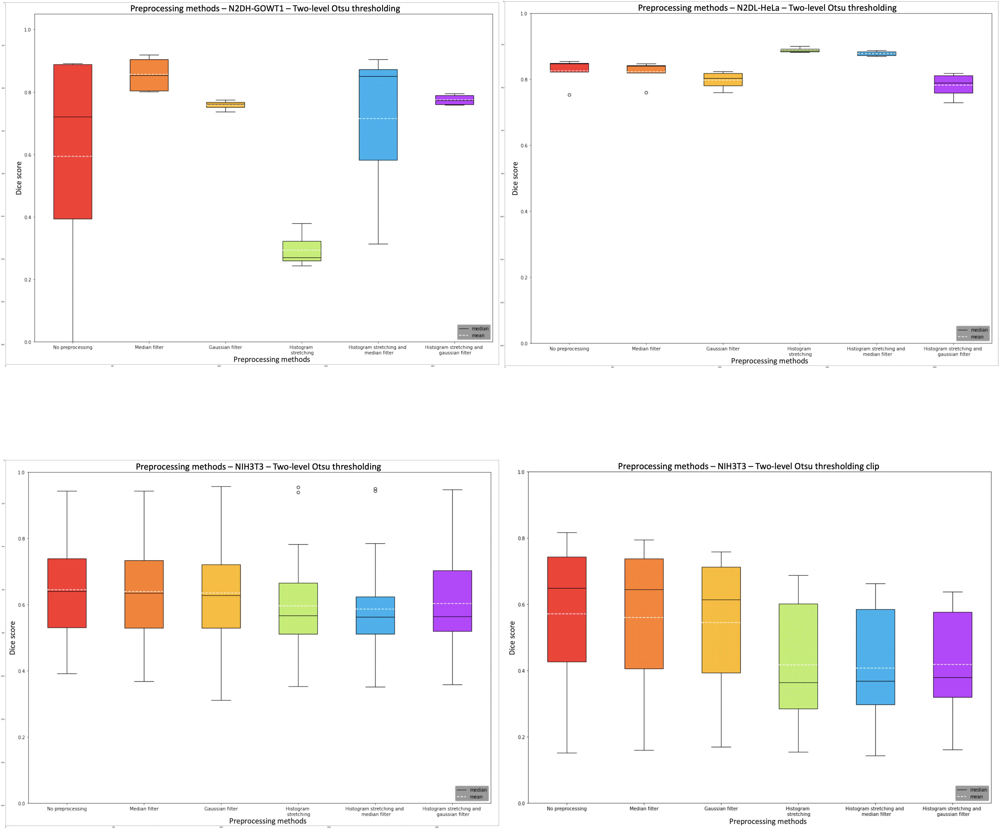

In [5]:
# Figure 2: Visualization of all obtained results for two-level Otsu thresholding, applied on each dataset, and for two-level Otsu thresholding clip, only applied on NIH3T3.

Preprocessing_methods_N2DH_GOWT1_Two_level_Otsu_Thresholding = imread(r'Outputs_Boxplots/Preprocessing_methods_N2DH-GOWT1_Two-level_Otsu_thresholding.png')
Preprocessing_methods_N2DL_HeLa_Two_level_Otsu_Thresholding = imread(r'Outputs_Boxplots/Preprocessing_methods_N2DL-HeLa_Two-level_Otsu_thresholding.png')
Preprocessing_methods_NIH3T3_Two_level_Otsu_Thresholding = imread(r'Outputs_Boxplots/Preprocessing_methods_NIH3T3_Two-level_Otsu_thresholding.png')
Preprocessing_methods_NIH3T3_Two_level_Otsu_Thresholding_clip = imread(r'Outputs_Boxplots/Preprocessing_methods_NIH3T3_Two-level_Otsu_thresholding_clip.png')

pp.subplot_four(Preprocessing_methods_N2DH_GOWT1_Two_level_Otsu_Thresholding , Preprocessing_methods_N2DL_HeLa_Two_level_Otsu_Thresholding , Preprocessing_methods_NIH3T3_Two_level_Otsu_Thresholding , Preprocessing_methods_NIH3T3_Two_level_Otsu_Thresholding_clip)

***


<h3><b>4.3 Local adaptive Otsu thresholding</b></h3>
<p style = 'text-align : justify;'>
As local adaptive Otsu thresholding average turned out to be be more efficient and precise than local adaptive Otsu thresholding count, only this algorithm was used for segmentation. It was applied on the N2DL-HeLa and the NIH3T3 dataset. The Dice score distributions of the datasets for the different preprocessing methods were visualized with individual boxplots and can be seen in Figure 3 "Visualization of all obtained results for local adaptive Otsu thresholding average, applied on the N2DL-HeLa and the NIH3T3 dataset". For each run the optimal framesize and stepsize needs to be selected. On the N2DH-GOWT1 dataset local adaptive Otsu thresholding average was not applied, which is explained further in the discussion. 
</p>
<br>
<h4><b>N2DL-HeLa</b></h4>
<p style = 'text-align : justify;'>
In Figure 3 "Preprocessing methods- N2DL-Hela -local adaptive Otsu thresholding average" it can be seen that the preprocessing methods histogram stretching and median filter as well as histogram stretching obtained the highest median Dice scores. To be more exact, the highest median Dice score achieved is 0.8089 by the application of the preprocessing method median filter and histogram stretching. The slightly lower median Dice score of 0.80846 is obtained by using only histogram stretching. Thus histogram stretching contributes mainly to the achievement of a high Dice score in the dataset N2DL-HeLa in combination with local adaptive Otsu thresholding average. 
No preprocessing, median filter, Gaussian filter and histogram stretching and Gaussian filter lead to lower median Dice scores. The worst preprocessing method in the N2DL-HeLa dataset is the Gaussian filter in combination with histogram stretching with a median Dice score value of 0.7476. 
In addition the interquartile ranges from Gaussian filter, histogram stretching, histogram stretching and median filter and histogram stretching and Gaussian filter are very small. In comparison the interquartile ranges of no preprocessing and median filter are much larger.
</p>
<br>
<h4><b>NIH3T3</b></h4>
<p style = 'text-align : justify;'>
The median Dice scores are very similar to each other as depicted in Figure 3 "Preprocessing methods- NIH3T3 -Local adaptive Otsu thresholding average". The highest Dice score for local adaptive Otsu thresholding average from the NIH3T3 dataset is obtained by the histogram stretching in combination with the Gaussian filter with a median Dice score of 0.8292. The lowest Dice score was achieved by the preprocessing method median filter which corresponds to a median Dice score of 0.8038. In addition the whole range of the Dice scores of no preprocessing, median filter, Gaussian filter and histogram stretching and Gaussian filter are largely distributed whilst the range of the Dice scores of histogram stretching and histogram stretching and median filter are much smaller. 
</p>
<br>

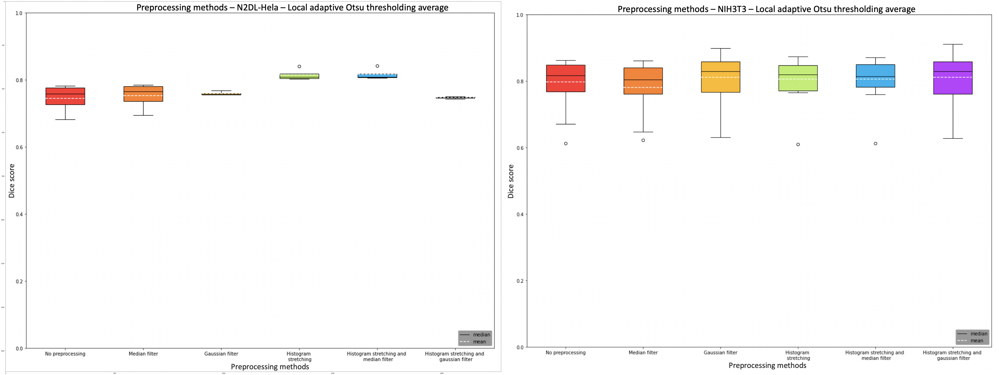

In [2]:
# Figure 3: Visualization of all obtained results for local adaptive Otsu thresholding average, applied on the N2DL-HeLa and the NIH3T3 dataset.

Preprocessing_methods_N2DL_HeLa_Local_adaptive_Otsu_Thresholding_average = imread(r'Outputs_Boxplots/Preprocessing_methods_N2DH-Hela_Local_adaptive_Otsu_thresholding_average.png')
Preprocessing_methods_NIH3T3_Local_adaptive_Otsu_Thresholding_average = imread(r'Outputs_Boxplots/Preprocessing_methods_NIH3T3_Local_adaptive_Otsu_thresholding_average.png')

pp.subplot_two(Preprocessing_methods_N2DL_HeLa_Local_adaptive_Otsu_Thresholding_average , Preprocessing_methods_NIH3T3_Local_adaptive_Otsu_Thresholding_average)

***


<h3><b>4.4 Local adaptive two-level Otsu thresholding</b></h3>
<p style = 'text-align : justify;'>
As further extension of local adaptive Otsu thresholding, the local adaptive thresholding algorithm can be combined with two-level Otsu thresholding instead of global Otsu thresholding and is applied to a selected image of each dataset. Each image is representive for the challenges and disruptive factors identified in the whole dataset. For each run the optimal framesize and stepsize needs to be selected as well.<br>
</p>
<p style = 'text-align : justify;'>
All obtained segmented images were pre-calculated and saved as .png-files. If needed these images as well as their corresponding ground truth images and unprocessed images can be called up below.
</p>
<br>

In [ ]:
# Run this code cell if the call up of the images is desired.
# Figure 4: Visualization of obtained results for local Otsu thresholding average (using two-level Otsu thresholding), applied on t31 of N2DH-GOWT1.


unprocessed_N2DH_GOWT1_t31 = imread(r'Outputs_Boxplots/no_preprocessing_N2DH-GOWT1_t31.png')
gt_N2DH_GOWT1_t31 = imread(r'Outputs_Boxplots/gt_N2DH-GOWT1_t31.png')
Local_Two_level_Otsu_thresholding_average_N2DH_GOWT1_t31 = imread(r'Outputs_Boxplots/Local_Two-level_Otsu_thresholding_average_N2DH-GOWT1_t31.png')

pp.subplot_three(unprocessed_N2DH_GOWT1_t31  , gt_N2DH_GOWT1_t31 , Local_Two_level_Otsu_thresholding_average_N2DH_GOWT1_t31)

In [ ]:
# Run this code cell if the call up of the images is desired.
# Figure 5: Visualization of obtained results for local Otsu thresholding average (using two-level Otsu thresholding), applied on t75 of N2DL-HeLa.

unprocessed_N2DL_HeLa_t75 = imread(r'Outputs_Boxplots/no_preprocessing_N2DL-HeLa_t75.png')
gt_N2DL_HeLa_t75 = imread(r'Outputs_Boxplots/gt_N2DL-HeLa_t75.png')
Local_Two_level_Otsu_thresholding_average_N2DL_HeLa_t75 = imread(r'Outputs_Boxplots/Local_Two-level_Otsu_thresholding_average_N2DL-HeLa_t75.png')

pp.subplot_three(unprocessed_N2DL_HeLa_t75 , gt_N2DL_HeLa_t75 , Local_Two_level_Otsu_thresholding_average_N2DL_HeLa_t75)

In [ ]:
# Run this code cell if the call up of the images is desired.
# Figure 6: Visualization of obtained results for local Otsu thresholding average (using two-level Otsu thresholding), applied on nda44 of NIH3T3.

unprocessed_NIH3T3_dna44 = imread(r'Outputs_Boxplots/no_preprocessing_NIH3T3_dna44.png')
gt_NIH3T3_dna44 = imread(r'Outputs_Boxplots/gt_NIH3T3_dna44.png')
Local_Two_level_Otsu_thresholding_average_NIH3T3_dna44 = imread(r'Outputs_Boxplots/Local_Two-level_Otsu_thresholding_average_NIH3T3_dna44.png')

pp.subplot_three(unprocessed_NIH3T3_dna44  , gt_NIH3T3_dna44 , Local_Two_level_Otsu_thresholding_average_NIH3T3_dna44)

<h4><b>N2DH-GOWT1</b></h4>
<p style = 'text-align : justify;'>
Local adaptive two-level Otsu thresholding was applied to the unpreprocessed image t31 of the N2DH-GOWT1 dataset, using a framesize of 400 and stepsize of 100. The segmented image was compared to its ground truth image and a Dice score of 0.4298 was obtained. In most cases the cell nuclei were correctly distinguished from the background. However, due to the high amount of background and noise in the dataset, the algorithm falsely assigned parts of the image to the foreground, leading to a low Dice score. This phenomenon is further explained in the discussion.
</p>
<br>
<h4><b>N2DL-HeLa</b></h4>
<p style = 'text-align : justify;'>
Moreover, local adaptive two-level Otsu thresholding was applied to the unpreprocessed image t75 of the N2DL-HeLa dataset, using a framesize of 300 and stepsize of 100. By comparing the segmented image to its ground truth image, a Dice score of 0.8646 was received. Nearly all cell nuclei were assigned correctly to the foreground, so the algorithm was not influenced by low contrast in the image to a certain extent. Cell nuclei with an intensity value very close to 0, can still not be assigned correctly, which consequently reduced the Dice score.
</p>
<br>
<h4><b>NIH3T3</b></h4>
<p style = 'text-align : justify;'>
In addition, local adaptive two-level Otsu thresholding was applied to the unpreprocessed image dna44 of the NIH3T3 dataset, using a framesize of 300 and stepsize of 100. The segmented image was compared to its ground truth image and a Dice score of 0.8243 was obtained. Mostly, the segmentation algorithm was not influenced by the non-uniform background and low contrast in the image. Consequently, most of the cell nuclei were correctly distinguished from the background. However, occurring reflections and bright artifacts were falsely assigned to the foreground, reducing the received Dice score. 
</p>


***


<h3><b>4.5 Local adaptive two-level Otsu thresholding clip</b></h3>
<p style = 'text-align : justify;'>
As further extension of local adaptive Otsu thresholding, the local adaptive thresholding algorithm can be combined with two-level Otsu thresholding clip instead of global Otsu thresholding and is applied to a selected image of each dataset. Each image is representive for the challenges and disruptive factors identified in the whole dataset. For each run the optimal framesize and stepsize needs to be selected as well.<br>
</p>
<p style = 'text-align : justify;'>
All obtained segmented images were pre-calculated and saved as .png-files. If needed these images as well as thei corresponding groun truth and unprocessed images can be called up below.
</p>
<br>

In [ ]:
# Run this code cell if the call up of the images is desired.
# Figure 7: Visualization of obtained results for local Otsu thresholding average (using two-level Otsu thresholding clip), applied on t31 of N2DH-GOWT1.


unprocessed_N2DH_GOWT1_t31 = imread(r'Outputs_Boxplots/no_preprocessing_N2DH-GOWT1_t31.png')
gt_N2DH_GOWT1_t31 = imread(r'Outputs_Boxplots/gt_N2DH-GOWT1_t31.png')
Local_Two_level_Otsu_thresholding_clip_average_N2DH_GOWT1_t31 = imread(r'Outputs_Boxplots/Local_Two-level_Otsu_thresholding_clip_average_N2DH-GOWT1_t31.png')

pp.subplot_three(unprocessed_N2DH_GOWT1_t31  , gt_N2DH_GOWT1_t31 , Local_Two_level_Otsu_thresholding_clip_average_N2DH_GOWT1_t31)

In [ ]:
# Run this code cell if the call up of the images is desired.
# Figure 8: Visualization of obtained results for local Otsu thresholding average (using two-level Otsu thresholding clip), applied on t75 of N2DL-HeLa.

unprocessed_N2DL_HeLa_t75 = imread(r'Outputs_Boxplots/no_preprocessing_N2DL-HeLa_t75.png')
gt_N2DL_HeLa_t75 = imread(r'Outputs_Boxplots/gt_N2DL-HeLa_t75.png')
Local_Two_level_Otsu_thresholding_clip_average_N2DL_HeLa_t75 = imread(r'Outputs_Boxplots/Local_Two-level_Otsu_thresholding_clip_average_N2DL-HeLa_t75.png')

pp.subplot_three(unprocessed_N2DL_HeLa_t75 , gt_N2DL_HeLa_t75 , Local_Two_level_Otsu_thresholding_clip_average_N2DL_HeLa_t75)

In [ ]:
# Run this code cell if the call up of the images is desired.
# Figure 9: Visualization of obtained results for local Otsu thresholding average (using two-level Otsu thresholding clip), applied on dna32 of NIH3T3.

unprocessed_NIH3T3_dna32 = imread(r'Outputs_Boxplots/no_preprocessing_NIH3T3_dna32.png')
gt_NIH3T3_dna32 = imread(r'Outputs_Boxplots/gt_NIH3T3_dna32.png')
Local_Two_level_Otsu_thresholding_clip_average_NIH3T3_dna32 = imread(r'Outputs_Boxplots/Local_Two-level_Otsu_thresholding_clip_average_NIH3T3_dna32.png')

pp.subplot_three(unprocessed_NIH3T3_dna32 , gt_NIH3T3_dna32 , Local_Two_level_Otsu_thresholding_clip_average_NIH3T3_dna32)

<br>
<h4><b>N2DH-GOWT1</b></h4>
<p style = 'text-align : justify;'>
Local adaptive two-level Otsu thresholding clip was applied to the unpreprocessed image t31 of the N2DH-GOWT1 dataset, using a framesize of 400 and stepsize of 100. The segmented image was compared to its ground truth image and a Dice score of 0.4482 was obtained. In most cases the cell nuclei were correctly distinguished from the background. However, the algorithm falsely assigned parts of the image to the foreground as already described for local adaptive two-level Otsu thresholding. In addition, the received segmented image showed holes within the cell nuclei, which impair the obtained Dice score as well.
</p>
<br>
<h4><b>N2DL-HeLa</b></h4>
<p style = 'text-align : justify;'>
Moreover, local adaptive two-level Otsu thresholding clip was applied to the unpreprocessed image t75 of the N2DL-HeLa dataset, using a framesize of 300 and stepsize of 50. By comparing the segmented image to its ground truth image, a Dice score of 0.7866 was received. Many cell nuclei were assigned correctly to the foreground, but also overlapping and distortion of cell nuclei and holes within the cell nuclei could be recorded. By performing hole filling as postprocessing method, the Dice score could be lifted to 0.8225.
</p>
<br>
<h4><b>NIH3T3</b></h4>
<p style = 'text-align : justify;'>
In addition, local adaptive two-level Otsu thresholding clip was applied to the unpreprocessed image dna32 of the NIH3T3 dataset, using a framesize of 300 and stepsize of 100. The segmented image was compared to its ground truth image and a Dice score of 0.5795 was obtained. The idea of the applied algorithm to remove relfelctions and bright artifacts showed its effect in the obtained image. The reflections were reduced by converting the corresponding pixels to 0. However, pixels in the cell nuclei with intensity values close to the intensity values of the reflections were set to 0 too. This lead to falsely assigned pixels and hole emergence within the cell nuclei.
</p>

***

<h2><b>5. Discussion</b></h2>
<h3><b>5.1 Global Otsu Thresholding</b></h3>
<h4><b>N2DH-GOWT1</b></h4>
<p style = 'text-align : justify;'>
As mentioned in the results the best preprocessing method for this dataset with global Otsu thresholding is histogram stretching. This can be explained when examining the images:
</p>
<br>

(-0.5, 711.5, 358.5, -0.5)

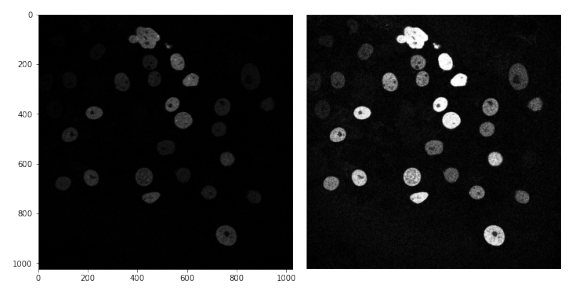

In [6]:
#Figure 10 : img t72.tif from the N2DH-GOWT1 dataset raw vs. stretched 

t72_comparison = imread(r'Outputs_Boxplots\t72_comparison.png')
figure(figsize=(10,10))
imshow(t72_comparison, 'gray')
plt.axis('off')

<p style = 'text-align : justify;'>
The pictures in this dataset have very low contrast and it is hard to make out some cells because they have nearly the same intensity values as the background. When using histogram stretching, the intensity values are stretched out, achieving a higher contrast. Therefore, the cell nuclei can be distinguished easier from the background, which can be seen in the not segmented picture above. This also allows the global Otsu algorithm to work better because it assigns more cell nuclei pixels to the foreground achieving higher Dice scores. Also, this results in narrower boxplots because the range of the intensity values is similar after the histogram stretching which results in Dice scores that are in the same range. 
What also can be observed with this dataset is the negative effect of the median and gaussian filters. The gauss filter has a blurring effect on the images which makes the cell nuclei pixels harder to distinguish from the background and does not positively affect the segmentation outcome.In addition, the median filter has a negative effect on the edges aswell.  Especially in combination with the hole filling the resulting Dice scores with the median filter and gauss filter are lower than without any preprocessing because of the blurred edges. In the unprocessed as well as in the stretched images the edges are sharp and with the postprocessing only the nucleoli (‘holes’) are filled in which results in a high Dice score.
</p>
<br>
<h4><b>N2DL-HeLa</b></h4>
<p style = 'text-align : justify;'>
In this dataset the combination of histogram stretching and the median filter led to the highest Dice score although all preprocessing methods in combination with histogram stretching showed a very similar range of Dice scores. This can be explained by the biggest challenge in this dataset, the varying brightness of the cell nuclei. Histogram stretching helps with heightening the contrast and therefore accentuating the lighter cell nuclei leading to a higher Dice score than without preprocessing although this results in the possible loss of darker cell nuclei.
</p>
<br>

(-0.5, 711.5, 244.5, -0.5)

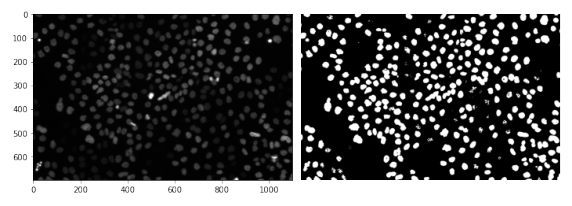

In [5]:
#Figure 11 : img t75.tif from the N2DL-HeLa dataset raw vs. stretched and segmented with global Otsu thresholding 

t75_comparison = imread(r'Outputs_Boxplots\t75_comparison.png')
figure(figsize=(10,10))
imshow(t75_comparison, 'gray')
plt.axis('off')

<p style = 'text-align : justify;'>
The bright cell nuclei can be clearly seen in the image but some of the darker nuclei are lost when segmenting the image, because of the range in intensity values and therefore the shift in the threshold value. This explains the generally lower Dice score than in the first dataset, where the cell nuclei are all relatively dark and histogram stretching brightens them all. 
We can also assume that the Dice scores with the median filter are slightly better than the gaussian filter because the images are more affected by impulsive noise than Gaussian noise. 
Also in this dataset the boxplots are very narrow which can be explained by the similarity of the images as well as by the size of the dataset which only contains four images, therefore being the smallest dataset. 
Lastly, in this case (as well as in NIH3T3) no hole filling was applied, because there are no nucleoli seen in the raw images. 
</p>
<br>
<h4><b>NIH3T3</b></h4>
<p style = 'text-align : justify;'>
In the results it was described that this dataset had a very wide spread of Dice scores. This can be explained by the biggest challenge of this dataset, the reflections. Because it is so big (18 images) some of the images have reflections and some do not. The ones without reflections show a very high dice score with all the preprocessing methods, with the histogram stretching being slightly better because of the aforementioned reasons.
The images with reflections show a very low Dice score, because the intensity values are significantly higher than the intensity values of the rest of the image resulting in only the reflections being counted as foreground by the global Otsu algorithm and very badly segmented images, thus resulting in the very low Dice scores.
</p>
<br>

(-0.5, 711.5, 283.5, -0.5)

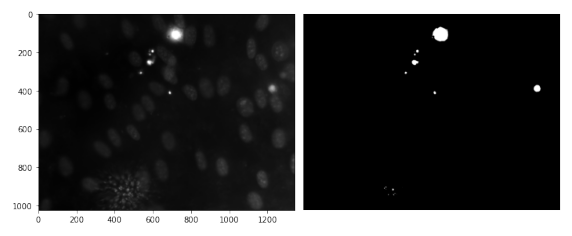

In [4]:
#Figure 12 : img dna-37.png from the NIH3T3 dataset raw vs.segmented with global Otsu thresholding 

dna37_comparison = imread(r'Outputs_Boxplots\dna-37_comparison.png')
figure(figsize=(10,10))
imshow(dna37_comparison, 'gray')
plt.axis('off')

<p style = 'text-align : justify;'>
Our used preprocessing methods do not lessen reflections except the histogram stretching which clips the upper and lower quantile, thereby slightly lowering the effect of the reflections but not getting rid of them. Thus, the distributions with all the preprocessing methods is relatively the same and widely spread. 
To achieve a better Dice score especially with the last two datasets we applied two-level Otsu thresholding as well as two-level Otsu thresholding clip. This Otsu variations help distinguishing cell nuclei with different brightness (like in the second dataset) as well as clipping the reflections (in the third dataset). 
</p>


***


<h3><b>5.2 Two-level Otsu Thresholding</b></h3>
<h4><b>N2DH-GOWT1</b></h4>
<p style = 'text-align : justify;'>
Using histogram stretching with the median filter resulted in the highest median Dice score for this dataset when using two-level Otsu thresholding . But just applying histogram stretching results in very low Dice scores which can be explained by looking at the images.
</p> 
<br>

(-0.5, 711.5, 358.5, -0.5)

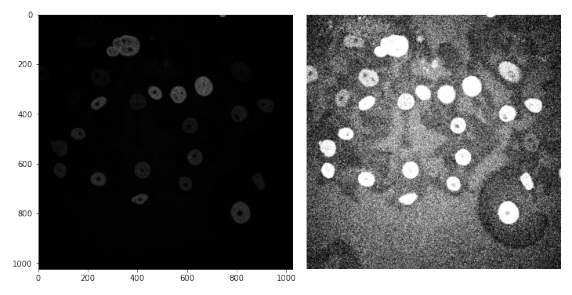

In [3]:
#Figure 13 : img t01.tif from the N2DH-GOWT1 dataset raw vs.stretched and segmented with two-level Otsu thresholding 

t01_comparison = imread(r'Outputs_Boxplots\t01_comparison.png')
figure(figsize=(10,10))
imshow(t01_comparison, 'gray')
plt.axis('off')

<p style = 'text-align : justify;'>
Applying two-level Otsu thresholding on the stretched image results in very badly segmented images because of the amount of noise in the background that is counted as foreground. Because the cell nuclei have similar intensity values in the stretched images and two thresholds are taken into account a lot of the background pixels will be in the intensity value range between the two thresholds and thus counted as foreground resulting in very low Dice scores. When applying histogram stretching with a filter this effect is lessened because the noise is filtered out. We can also assume that the images are more affected by impulsive than Gaussian noise because the median filter results in higher Dice scores. 
Furthermore, it needs to be mentioned that in this dataset some images show cell nuclei that seem to be distributed in different levels. The two-level Otsu thresholding helps assigning more pixels from different levels to foreground resulting in generally higher Dice scores than with the global Otsu algorithm because more cell nuclei are counted as foreground. But this does not seem to be the case in all images of this dataset which can be seen when examining the large width of the boxplots indicating a big difference between the images. The pictures with cell nuclei mostly in one level result in lower Dice scores because more of the noise in the background is counted as foreground. 
Lastly, on this dataset hole filling was applied which also heightened the Dice scores by closing the nucleoli ‘holes’. 
</p>
<br>
<h4><b>N2DL-HeLa</b></h4>
<p style = 'text-align : justify;'>
With this dataset the highest Dice scores could be achieved with the histogram stretching. Also the Dice scores were higher than the global Otsu thresholding Dice scores. This can be explained by the varying brightness of cell nuclei in this dataset. With the histogram stretching the brighter cell nuclei are accentuated but when applying two-level Otsu thresholding the darker cells are also taken into account because of the two thresholds. Thus, more cell nuclei pixels are counted as foreground than in the global Otsu resulting in much higher Dice scores and a thinner distribution because the cell nuclei are all around the same brightness. Therefore, the methods with histogram stretching achieve higher Dice scores but just two-level Otsu thresholding already leads to a better segmented image. 
</p>
<br>
<h4><b>NIH3T3</b></h4>
<p style = 'text-align : justify;'>
This dataset showed the lowest Dice scores out of all three datasets and the widest range of Dice scores. The reasons for this were already discussed in the global Otsu thresholding part. The Dice scores when applying two-level Otsu thresholding are generally higher because more cell nuclei are considered than before because of the two thresholds. But the Dice scores when using histogram stretching as preprocessing are slightly lower.
This can be explained by the fact that two-level Otsu thresholding does not clip the reflections. Therefore, when stretching the images, the reflections are brightened resulting in a shift of the threshold values to the higher intensity values. Therefore, the darker cell nuclei are getting assigned to the background resulting in lower Dice scores. Moreover, preprocessing in general seems to have a negative effect on the Dice scores because of their blurring effect especially on edges which especially in combination with histogram stretching only makes the effect of the reflections on the intensity value histogram stronger. 
To clip the reflections, two-level Otsu thresholding clip was applied on this dataset in hopes of achieving a better segmentation. The median Dice score was slightly higher without preprocessing and the reflections were clipped as can be seen in the following image: 
</p>
<br>

(-0.5, 711.5, 283.5, -0.5)

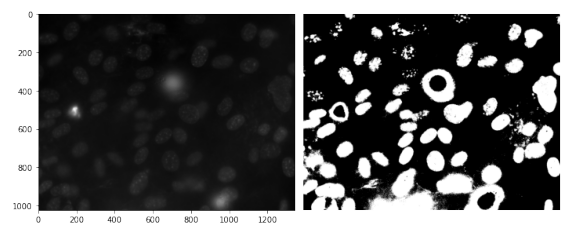

In [7]:
#Figure 14 : img dna-30.png from the NIH3T3 dataset raw vs.segmented with two-level clip Otsu thresholding 

dna30_comparison = imread(r'Outputs_Boxplots\dna30_comparison.png')
figure(figsize=(10,10))
imshow(dna30_comparison, 'gray')
plt.axis('off')

<p style = 'text-align : justify;'>
Although the Dice scores with preprocessing were much lower and the effect of the clip method was not as high as expected. The negative effect of the preprocessing with histogram stretching can be explained by the fact, that with the higher contrast more cell nuclei were above the second threshold, therefore probably some pixels were clipped with the reflections resulting in a lower Dice score. Furthermore, the effect was lower overall because not all images were affected by reflections and in those images clip resulted in a lower Dice score. 
</p>
<br>
<h4><b>Challenges</b></h4>
<p style = 'text-align : justify;'>
Also, we will discuss some of the challenges that were encountered when programming the Otsu algorithm. 
First, the biggest issue was runtime optimization. Herefore, the global Otsu thresholding code as well as the two-level Otsu thresholding code were mostly vectorized which reduced the runtime from around 1s per image two about 0.1s per image. Furthermore, we decided to only calculate the between class variance rather than the within class variance which further reduced the runtime to around 0.04s per image because the variance did not have to be computed. Therefore, the runtime for applying the global Otsu thresholding algorithm on all given images is about 1.2s. The two-level Otsu thresholding runtime is significantly larger because of the second for-loop and the image clipping which all takes about 20s per image. This long runtime is also the reason for not applying two-level Otsu thresholding together with local adaptive thresholding on all images which will be discussed further in the local thresholding part. 
Secondly, the runtime could be reduced when changing from the maplotlib histogram function to the numpy histogram function which did not plot the histogram anymore, thereby reducing runtime. 
Furthermore, we decided on the bin size 256 for thresholding after trying out different bin sizes as well as examining the intensity value histograms of the images. Two datasets showed the range of 0-255 in their intensity values and the third one showed the best segmentation outcomes with this bin size. Therefore, also taking the runtime into account, 256 was chosen as the optimal bin size, thus examining each threshold at each integer from 0-255. 
Finally, our last challenge was finding the optimal filter size for each dataset and each preprocessing method. This was solved by comparing the dice scores with different filter sizes from 1 to around 30 (taking the image size into account) and finding the optimal one for each dataset, maximizing the Dice scores. 
</p>


***


<h3><b>5.3 Local adaptive Otsu Thresholding</b></h3>
<p style = 'text-align : justify;'>
The main aim of local adaptive thresholding was segmentation of pictures with non-uniform illumination, therefore the efficiency of the algorithm was first and foremost tested on the NIH3T3 dataset, where such problem would often be present. Two separate algorithms were developed, as elaborated in Methods. 
</p>
<br>
<p style = 'text-align : justify;'>
While developing the algorithms, there were issues which arose in both of them, due to the nature of the sliding window iterations, as well as unique upsides and downsides emerged for each of the algorithms.
</p> 
<br>
<p style = 'text-align : justify;'>
The most prominant challenge in both “local adaptive thresholding average” and “local adaptive thresholding counts” were non-segmented picture edges. The sliding window iterations would always begin at the upper left corner of an image, therefore in outputs one would usually see completely black right and lower edges, which the sliding window algorithm simply could not access, if the size of an image were not a multiple of the chosen stepsize. To deal with this issue, referred to as “the edge problem”, the algorithm was extended, by translating the pixel values onto a larger array than the original picture. In such manner a lower and a right edge was attached with height or width equal to the framesize, set by the user, carrying a NaN value in each position. The sliding window now could iterate over the bounds of the original image array, while still calculating  proper threshold values in each frame, as the NaN values could simply be ignored. This method increases the runtime of the algorithm, by adding extra iterations, the number of which depends on the proportion of framesize over stepsize. By rounding the proportion down to the closest integer value, one could directly calculate exactly how many additional frames are added per every iteration row/column, thus the runtime increase can be easily approximated by the user before executing the algorithm. Although this method considers all the pixels in the input image, the intensity assignments for pixels located in the bottom and right is less consistent than for the rest of the image, as the more NaNs contained in an iteration frame, the less values are used for the calculation of the threshold and the confidence decreases for pixels further out.
</p>
<br>
<p style = 'text-align : justify;'>
Other solutions were considered, such as running the algorithm twice, first starting the iterations at the top left pixel and second time at the bottom right pixel, defining a “backward local thresholding average”. By uniting the two algorithms the segmented picture would have cleaner edges, especially the bottom and right edge, yet here the upper right and bottom left corners would remain fully black, as those were the overlapping areas for where sliding window would not reach in both algorithms. Such an algorithm also takes almost twice as much time as the previously defined solution, while still containing non-segmented areas. One could define an algorithm, where the sliding window is run 4 times, each time beginning from a different corner, yet such an algorithm would be an even larger increase in runtime and might not be worth implementing, unless the user has a small dataset and wants segmentation as perfect as possible.
</p>
<br>
<p style = 'text-align : justify;'>
A solution, that could also be further implemented, would be “patching up” the non-segmented areas after all sliding window iterations. Here one could compute additional threshold values/ assign pixel values, for additionally defined frames, which were previously not considered. Such method would only add a few up to few dozen seconds of runtime (based on framesize and stepsize) and would take into account the same amount of pixels for threshold calculation as for the frames in the sliding window iterations. 
</p>
<br>
<p style = 'text-align : justify;'>
As the local thresholding algorithm performs Otsu thresholding at each iteration, the runtime of the algorithm directly correlates with the runtime of Otsu thresholding itself, as well as number of iterations, which in the simple case (no NaN edges, algorithm is run once, only forwards), would be approximately equal to image shape divided by stepsize, squared. Thus, for optimisation of the algorithm itself, the greatest reduction in runtime followed the optimisation and vectorization of Otsu thresholding, rather than optimisation of the local thresholding algorithm itself. In any case, by setting a stepsize, the user still defines the final runtime of the algorithm themselves, and one has to consider, that depending on how detailed the input image is, the segmentation can take from up to a minute (45 seconds for “mean” algorithm with NaN edges at stepsize = 50 and framesize = 200 on NIH3T3 images) to a few minutes (runtime will also differ based on outer factors, for example the processor of the computer, thus these values are only representative). 
</p>
<br>
<p style = 'text-align : justify;'>
An issue that arose in all datasets was random noise in areas with no distinguishable cell nuclei, that were bigger than the iteration frame (framesize x framesize), due to random assignment of pixels to foreground or background. In "local adaptive Otsu thresholding count” this means, that for each iteration frame containing only background, a random array of 0’s and 1’s would be generated. For a smaller number of unique pixel foreground/background assignments these random assignments (for example at framesize = 150, stepsize = 50, only 3 frames contribute to each pixel) could easily influence the final segmentation and lead to large areas of random noise. Because local adaptive Otsu thresholding average only assigns a pixel intensity once the average threshold is calculated, this allows for a more dynamic segmentation with less or no random noise and leads to higher Dice score coefficients, therefore this algorithm was used as the final local adaptive thresholding algorithm.
</p>
<br>
<p style = 'text-align : justify;'>
The random noise artifacts were the main influence on the segmentation quality and led to lower Dice scores, especially if the algorithms were used on the N2DH-GOWT1 dataset, where generally large areas with no distinguishable object (such as picture t39 of the dataset) were present. Due to no apparent non-uniform illumination and great reduction in segmentation quality in comparison to global thresholding, local thresholding was not further analysed as a segmentation method for this dataset. 
For the other two datasets (N2DL-HeLa and NIH3T3) both local adaptive Otsu thresholding count and local adaptive Otsu thresholding average were applied. An algorithm to automatically compare the Dice scores for both segmentations for each dataset was implemented and for both datasets segmentation with and without any kind of preprocessing returned a constant higher Dice score average for the local adaptive Otsu thresholding average algorithm, which can be explained by the more dynamic nature of the algorithm. Further only the results for this algorithm will be elaborated, as it was chosen as the better version from the two segmentation algorithms.
</p>
<br>
<p style = 'text-align : justify;'>
For the NIH3T3 dataset the local adaptive segmentation showed a clear increase in the Dice score in comparison to global Otsu thresholding, as one would predict for images with differentiating brightness, the median Dice scores being accordingly 0.8173 and 0.6720 without preprocessing. Local adaptive segmentation as expected proved to be the optimal segmentation method for this dataset, even though some random noise would still be present in the edges of some segmented images. To increase the segmentation accuracy, one could use a better method that deals with “the edge problem”, as well as set a smaller stepsize to retreive a more accurate average threshold. An issue that this algorithm could not deal with in the NIH3T3 dataset were reflections, which were considered as background in the ground truth images, but can by no means be considered as background in a simple local adaptive thresholding algorithm, as pixels that clearly have a higher intensity than the rest of the image will be considered as foreground in each and every frame they appear in. To try solve this problem, two-level Otsu thresholding clip function was combined with local adaptive thresholding average to calculate two average thresholds for each frame and assign such pixels to the foreground, which had an intensity between the two calculated thresholds. Unfortunately, as there were only a few reflections on the image, that meant, that most frames would perceive actual nuclei as reflections and set their intensity values to 0, ending up in huge decrease in segmentation quality, returning a Dice score of around 0.580. Larger framesizes could be considered for images, where reflections are more evenly distributed to possibly deal with both the brightness issue as well as the reflections, yet the NIH3T3 dataset does not allow for this.
</p>
<br>
<p style = 'text-align : justify;'>
The N2DL-HeLa dataset did not seem to have a significant difference in segmentation quality using the global Otsu thresholding function or local adaptive Otsu thresholding. The median Dice score for segmentation was 0.7384 with global Otsu thresholding and 0.7584 with local adaptive Otsu thresholding. As there were only 4 pictures in the dataset, the chosen stepsize and framesize (100 and 300) that was used in the local adaptive thresholding could only happen to be the optimal values and could not be extrapolated for other pictures with similar qualities as this dataset. Two further characteristics of the N2DL-HeLa dataset influence the segmentation. Firstly, two of the pictures contained large areas with no distinguishable nuclei, while in the other two the nuclei were evenly distributed. Secondly, the pictured nuclei seemed to be separated in two layers - there were such which would clearly appear brighter and ones, that would have a lower intensity value, each class sharing a similar brightness level. Due to the large background areas, a framesize which would be big enough to avoid the emergence of random noise had to be chosen, which in return lead to iteration frames, which were too big to distinguish the nuclei with lower brightness as foreground. To solve this issue two-level local adaptive Otsu thresholding average was implemented again, this time assigning all pixels with intensities above the lower threshold to foreground (two-level local adaptive thresholding average clip). Because the two-level Otsu thresholding for one picture already takes around 20 seconds and it had to be performed on each iteration, the runtime of such algorithm is high (it took on average 25 minutes to segment one picture), therefore only one picture (N2DL-HeLa seg52) was segmented with such an algorithm and it showed a Dice score of 0.865, while the Dice score for normal local adaptive Otsu thresholding for this picture was 0.741 and two-level Otsu thresholding -0.847. It seems that it did not matter, if the image was locally or globally thresholded before segmentation, which means there was probably not a huge difference in background illumination in different areas of the picture and instead of running an algorithm for 20 minutes one could retreive an even slightly more accurately segmented picture with simple two-level Otsu thresholding.
</p>

***


<h2><b>6. Conclusion</b></h2>
<p style = 'text-align : justify;'>
In summary, in our project the optimal preprocessing method for each dataset and different thresholding algorithms was identified. Finally, the optimal combination of preprocessing and Otsu thresholding method was selected for each dataset, to achieve the highest median Dice score and the best segmentation results. Showing a median Dice score of 0.8864, the combination of histogram stretching, hole filling and global Otsu thresholding was selected as the most efficient and accurate segmentation method for the N2DH-GOWT1 dataset. Equivalently, histogram stretching combined with two-level Otsu thresholdig was chosen as optimal segmentation method for the N2DL-HeLa dataset, showing a median Dice score of 0.8866. For the NIH3T3 dataset, the combination of Gaussian filter, histogram stretching and local adaptive Otsu thresholding showed the highest Dice score of 0.8293 and is selectd as optimal segmentation method for this dataset.
</p>


***


<h2><b>7. References</b></h2>
<p style = 'text-align : justify;'>
Bartova, E., Sustackova, G., Stixova, L., Kozubek, S., Legartova, S., and Foltankova, V. (2011). Recruitment of Oct4 protein to UV-damaged chromatin in embryonic stem cells. PLoS One 6, e27281.<br>
</p>
<p style = 'text-align : justify;'>
Coelho, L.P., Shariff, A., and Murphy, R.F. (2009). Nuclear Segmentation in Microscope Cell Images: A Hand-Segmented Dataset and Comparison of Algorithms. Proc IEEE Int Symp Biomed Imaging 5193098, 518-521.<br>
</p>
<p style = 'text-align : justify;'>
Davies, E. R. (2012). Machine Vision: Theory, Algorithms and Practicalities: Fourth Edition (Academic Press), 26.<br>
</p>
<p style = 'text-align : justify;'>
Dhanachandra, N., Manglem, K., and Chanu, Y. J. (2015). Image segmentation using K-means clustering algorithm and subtractive clustering algorithm. Procedia Comput. Sci., vol. 54, pp. 764–771.<br>
</p>
<p style = 'text-align : justify;'>
Dice, L. R. (1945). Measures of the Amount of Ecologic Association Between Species. Ecology, 26(3), 297–302.<br> 
</p>
<p style = 'text-align : justify;'>
Liu, L., Li, K., Qin, W., Wen, T., Li, L., Wu, J., and Gu, J. (2018). Automated breast tumor detection and segmentation with a novel computational framework of whole ultrasound images. Med Biol Eng Comput 56, 183-199.<br>
</p>
<p style = 'text-align : justify;'>
Ljosa, V., Sokolnicki, K.L., and Carpenter, A.E. (2012). Annotated high-throughput microscopy image sets for validation. Nat Methods 9, 637.<br>
</p>
<p style = 'text-align : justify;'>
Minaee, S., Boykov, Y., Porikli, F., Plaza, A., Kehtarnavaz, N., and Terzopoulos, D. (2022). Image Segmentation Using Deep Learning: A Survey. IEEE Trans Pattern Anal Mach Intell 44, 3523-3542.<br>
</p>
<p style = 'text-align : justify;'>
Neumann, B., Walter, T., Heriche, J.K., Bulkescher, J., Erfle, H., Conrad, C., Rogers, P., Poser, I., Held, M., Liebel, U., et al. (2010). Phenotypic profiling of the human genome by time-lapse microscopy reveals cell division genes. Nature 464, 721-727.<br>
</p>
<p style = 'text-align : justify;'>
Nixon, M.S., and Aguado, A.S. (2002). Feature extraction and image processing (Oxford: Newnes).<br>
</p>
<p style = 'text-align : justify;'>
Nock, R., and Nielsen, F. (2004). Statistical region merging. IEEE Trans Pattern Anal Mach Intell 26, 1452-1458.<br>
</p>
<p style = 'text-align : justify;'>
Otsu, N. (1979). A threshold selection method from gray-level histograms. IEEE Trans. Syst. Man Cybern. 9:1, 62-66.<br>
</p>
<p style = 'text-align : justify;'>
Rohr, K., Ritter, C., (2022). Part 3: Filtering. Computermethoden: Computer Vision, 46-58.<br>
</p>
<p style = 'text-align : justify;'>
Ulman, V., Maska, M., Magnusson, K.E.G., Ronneberger, O., Haubold, C., Harder, N., Matula, P., Matula, P., Svoboda, D., Radojevic, M., et al. (2017). An objective comparison of cell-tracking algorithms. Nat Methods 14, 1141-1152.<br>
</p>